# YOLOv10

## 0. Importing libraries

import necessary libraries and modules and sets environment variables.

* Importing Libraries:
   - `os` module provides a way to interact with the operating system.
   - `PIL` (Python Imaging Library) provides image processing capabilities.
   - `ast` module is used for parsing Python literal structures.
   - `torch` is a popular machine learning library.
   - `tensorboard` is used for visualization and monitoring of training models.
   - `PIL.Image` is a module within PIL for working with images.
   - `glob` is used for file pattern matching.
   - `Path` from `pathlib` provides an object-oriented interface to filesystem paths.
   - `numpy` is a library for numerical operations.
   - `pandas` is used for data manipulation and analysis.
   - `IPython.display` allows for displaying images and other media types in IPython.

* Setting Environment Variables:
   - `os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'` sets the minimum log level for TensorFlow to 2, which silences TensorFlow warnings.

The code snippet is preparing the environment and importing required libraries for further operations. It sets up the necessary dependencies and configurations to ensure smooth execution of subsequent code.


# -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- --
## Training setup

### 1. GPU memory usage
Run this code lines to check CUDA and GPU memory availabilty

In [1]:
import yaml
import os
from glob import glob
from ultralytics import YOLO
import matplotlib.pyplot as plt
import PIL
from PIL import ImageDraw
from IPython.display import Image, display# clear_output
from utils import getBounds, getHeight, getWidth

import os
os.environ['WANDB_DISABLED'] = 'true'
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # silence tf warnings

## 1. Data preprocessing

visualize the annotated bounding boxes on a random selection of three images from your dataset, helping you verify the correctness of the annotations before training your model.

1. It then specifies the path to the YAML file containing the dataset configuration, `dataset.yaml`. This file contains information about the paths to the training images and their corresponding label files.

2. The code loads the dataset configuration from the YAML file using the `yaml.safe_load()` function. This configuration is stored in the dataset_config variable.

3. Next, it extracts the paths to the training images and the corresponding label files from the dataset configuration.

4. The code retrieves a list of image files in the training path using `os.listdir()`. These files represent the images that will be randomly selected for annotation visualization.

5. It randomly selects three images from the list of image files using the `random.sample()` function.

6. The code then iterates over the randomly selected image files.

7. For each image file, it loads the image using the `Image.open()` function from the `PIL` library. This allows the code to work with the image and apply annotations.

8. The corresponding label file path is determined by replacing the "*images*" directory with "*labels*" in the image file path.

9. The bounding box coordinates are read from the label file using the `open()` function and `readlines()` method. These coordinates represent the location and size of the objects of interest in the image.

10. The bounding box coordinates are prepared for plotting by converting them from normalized values to pixel coordinates based on the image size.

11. The code uses the `ImageDraw.Draw()` function from `PIL` to draw bounding boxes on the image. It iterates over the bounding box coordinates and draws a rectangle for each bounding box.

12. Finally, the annotated image is displayed using `display()` from `IPython.display`. The image will be shown with the bounding boxes in the output of the code cell when executed in an IPython environment.

In [ ]:
import random

# Specify the path to the YAML file
yaml_file_path = '/home/data/FlightScope_data/dataset.yaml'

# Load the YAML file
with open(yaml_file_path, 'r') as f:
    dataset_config = yaml.safe_load(f)

# Get the train and labels paths from the dataset configuration
train_path = dataset_config['train']
labels_path = dataset_config['train'].replace('images', 'labels')

# Get a list of image files in the train path
image_files = os.listdir(train_path)

# Randomly select 3 images
random_images = random.sample(image_files, 3)

# Iterate over the randomly selected images
for image_file in random_images:
    # Load the image
    image_path = os.path.join(train_path, image_file)
    image = PIL.Image.open(image_path)

    # Load the corresponding label file
    label_file = os.path.splitext(image_file)[0] + '.txt'
    label_path = os.path.join(labels_path, label_file)

    # Read the bounding box coordinates from the label file
    with open(label_path, 'r') as f:
        lines = f.readlines()

    # Prepare the bounding box coordinates for plotting
    bboxes = []
    for line in lines:
        class_id, x_center, y_center, width, height = map(float, line.strip().split())
        xmin = int((x_center - width / 2) * image.width)
        ymin = int((y_center - height / 2) * image.height)
        xmax = int((x_center + width / 2) * image.width)
        ymax = int((y_center + height / 2) * image.height)
        bboxes.append((xmin, ymin, xmax, ymax))

    # Draw bounding boxes on the image
    draw = ImageDraw.Draw(image)
    for bbox in bboxes:
        draw.rectangle(bbox, outline='red', width=4)

    # Plot the image with bounding boxes
    plt.imshow(image)
    plt.title(f'Image: {image_file}')
    plt.axis('off')
    plt.show()


## Evaluation on unseen images: 

**Replace** `MODEL_PATH` with the value of your latest trained weights.

Prediction visualization

## 2. Training
To train the YOLOv8 network we need to import it and specify the required parameters.
Parameters:  
 - model:      the default model .yaml config file or the .pt model (if using a pretrained model)
 - data:       the localisation of the dataset.yaml we defined earlier
 - imgsz:      the image size, here our 512x tiles
 - project:    where the training experiments data will be saved (here under the ./runs/train/ subfolder in the current directory)
 - batch-size: useful on larger datasets
 - epochs:     training steps

In [ ]:
datapath = "./FlightScope_data/dataset.yaml"

model = YOLO(model = "yolov10x.yaml") # Training froms sratch a new model, v10x is the largest

## 500 epochs training

Benchmark

We use the [CLI](https://docs.ultralytics.com/modes/train/#__tabbed_1_2) for better training logging.

In [7]:
datapath = "/home/safouane/Downloads/FlightScope_Bench/FlightScope_data/dataset.yaml"
project_name = "expv10-200"

Warning: long command. Using nohup (in terminal) to keep progress if disconnected.

In [8]:
!yolo detect train data=$datapath model=yolov8x.yaml epochs=500 imgsz=512 project=$project_name device=1,2

Ultralytics 8.3.35 🚀 Python-3.8.20 torch-2.0.1 CUDA:1 (NVIDIA RTX A6000, 48670MiB)
                                                CUDA:2 (NVIDIA RTX A6000, 48667MiB)
engine/trainer: task=detect, mode=train, model=yolov8x.yaml, data=/home/safouane/Downloads/FlightScope_Bench/FlightScope_data/dataset.yaml, epochs=500, time=None, patience=100, batch=16, imgsz=512, save=True, save_period=-1, cache=False, device=(1, 2), workers=8, project=expv10-200, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=Fa

In [ ]:
MODEL_PATH = "output_tensor/yolov10/weights/best.pt"

trained_model = YOLO(model=MODEL_PATH)
results = trained_model(source="./inference_test/unseen/", imgsz = 1024, conf = 0.1, save = True,
                        save_txt = True, save_conf = True, project = "inference_test/results/yolov10_inference/")  # predict on unseen images



image 1/10 /home/safouane/Downloads/FlightScope_Bench/inference_test/unseen/003_set2.jpg: 608x1024 10 Aircrafts, 17.9ms
image 2/10 /home/safouane/Downloads/FlightScope_Bench/inference_test/unseen/022f91f0-1434-401f-a11b-e315b7068100.jpg: 1024x1024 26 Aircrafts, 30.8ms
image 3/10 /home/safouane/Downloads/FlightScope_Bench/inference_test/unseen/058_set2.jpg: 608x1024 12 Aircrafts, 18.0ms
image 4/10 /home/safouane/Downloads/FlightScope_Bench/inference_test/unseen/066_set2.jpg: 608x1024 9 Aircrafts, 17.5ms
image 5/10 /home/safouane/Downloads/FlightScope_Bench/inference_test/unseen/08a8132a-a6c7-4cab-adee-7e2976fd2822.jpg: 1024x1024 28 Aircrafts, 30.9ms
image 6/10 /home/safouane/Downloads/FlightScope_Bench/inference_test/unseen/22bc9d20-02c4-4554-8fed-2c127d54b5ed.jpg: 1024x1024 32 Aircrafts, 30.4ms
image 7/10 /home/safouane/Downloads/FlightScope_Bench/inference_test/unseen/31_set1.jpg: 608x1024 14 Aircrafts, 17.9ms
image 8/10 /home/safouane/Downloads/FlightScope_Bench/inference_test/unsee

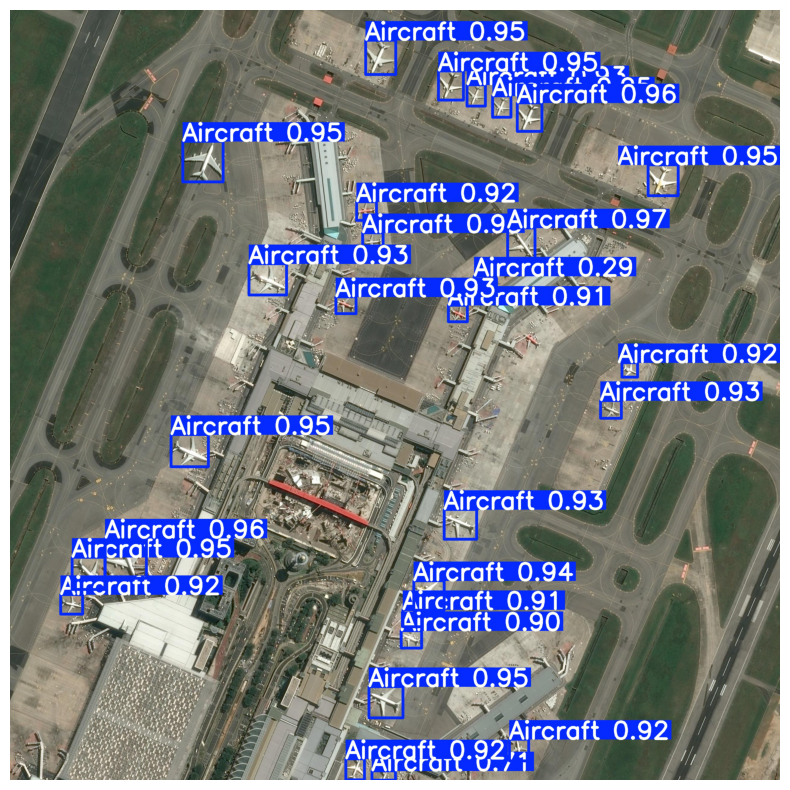

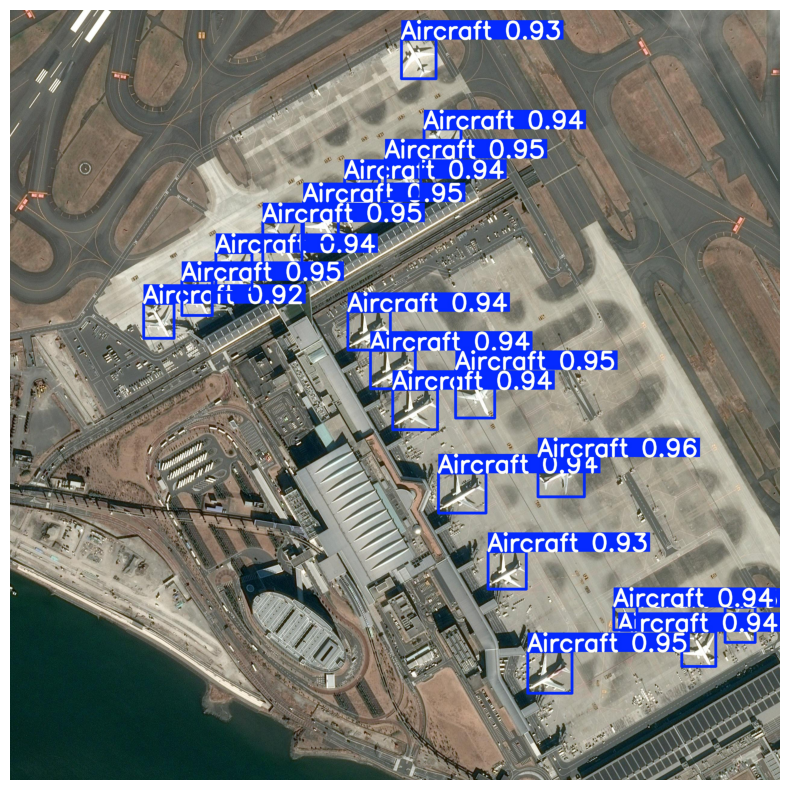

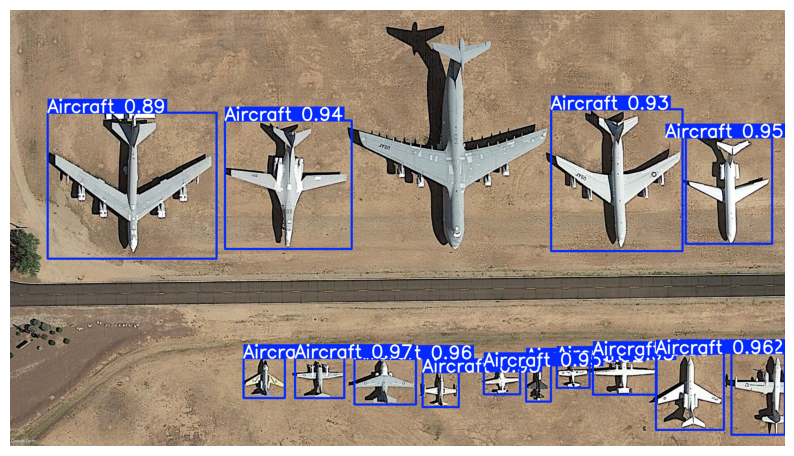

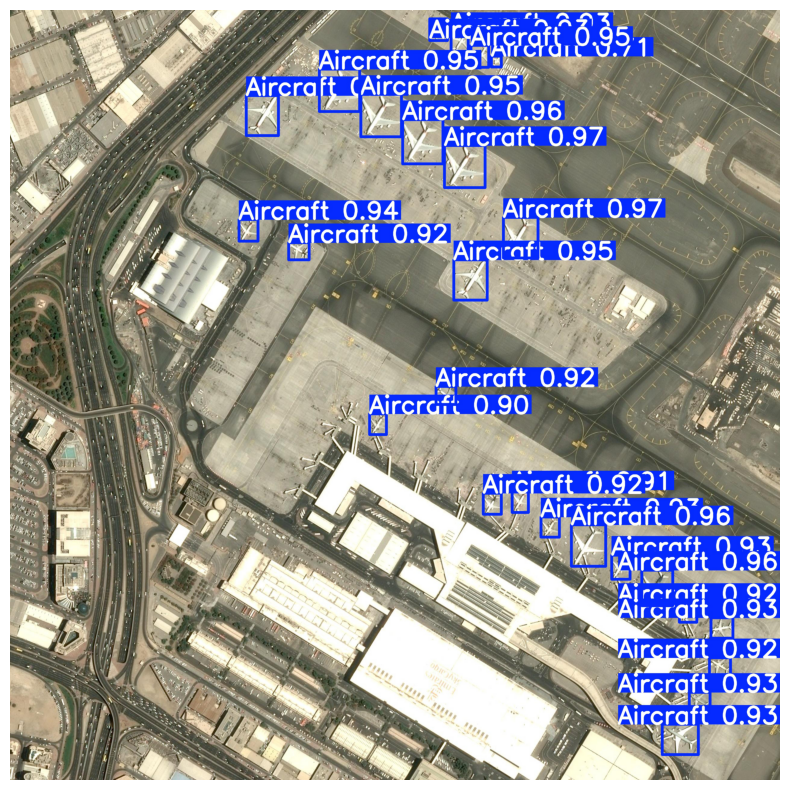

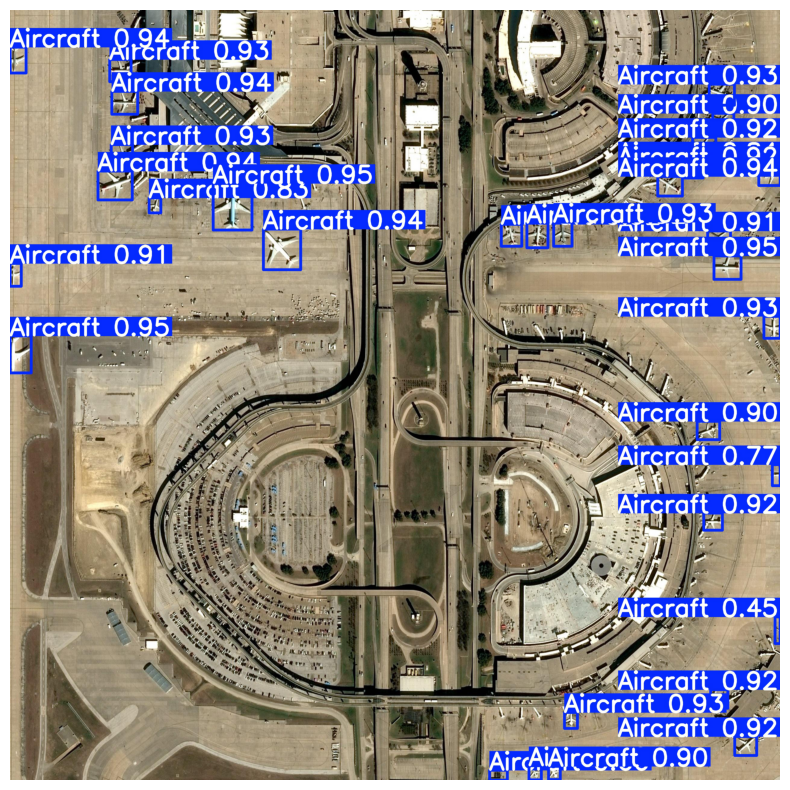

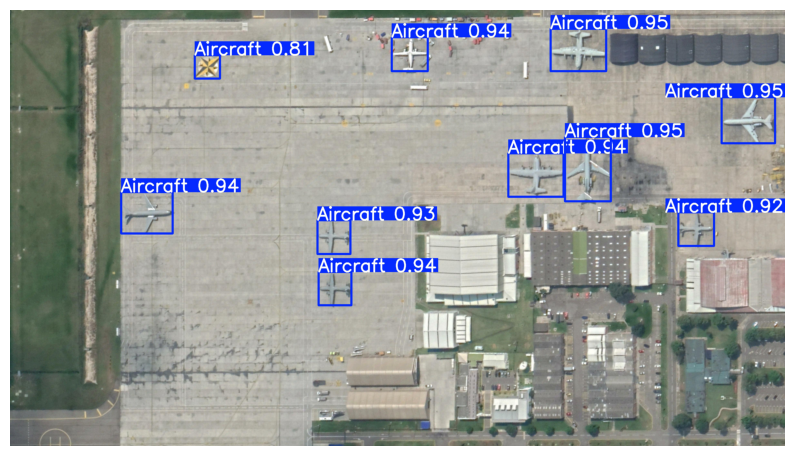

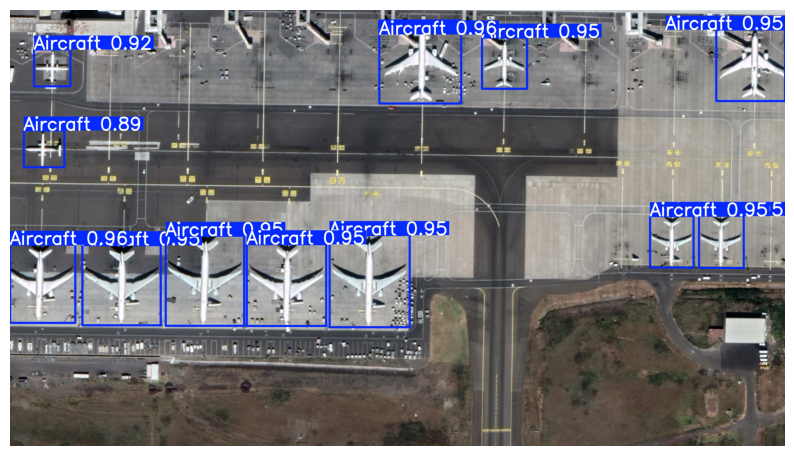

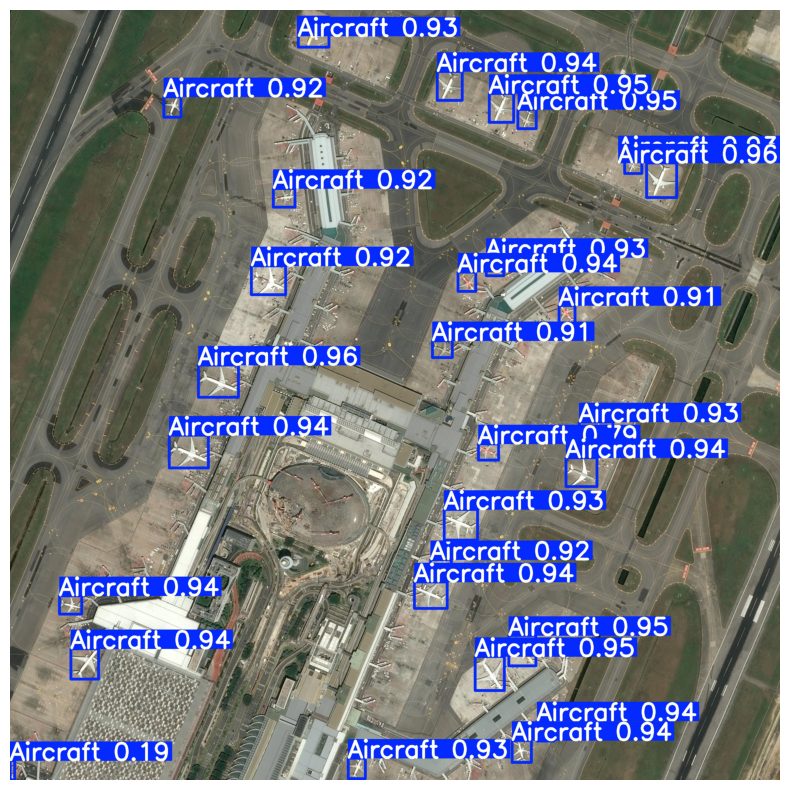

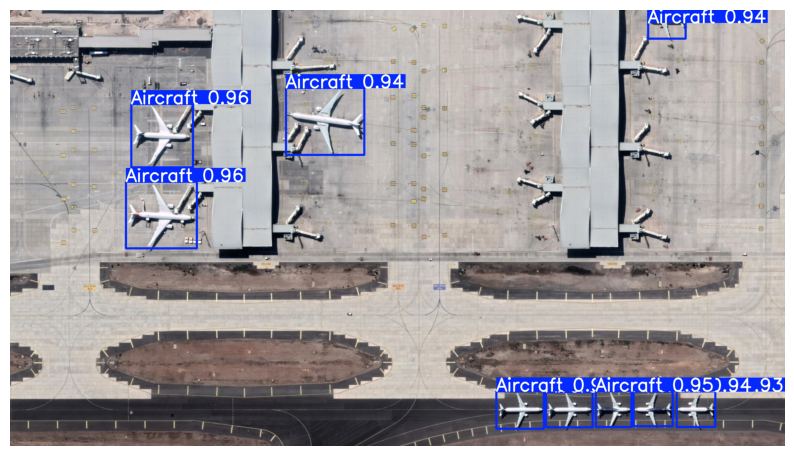

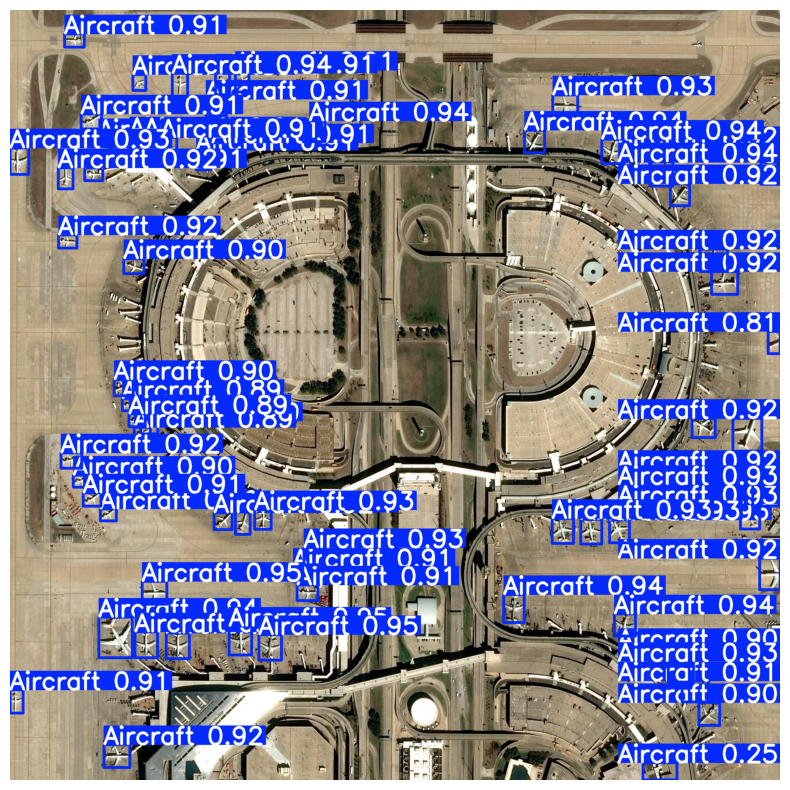

In [3]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Define the path to the directory containing the jpg images
path_to_images = './inference_test/results/yolov10_inference/predict'

# Iterate over each file in the directory
for file in os.listdir(path_to_images):
    # Check if the file is a jpg image
    if file.endswith('.jpg'):
        # Open the image using PIL
        img = Image.open(os.path.join(path_to_images, file))

        # Convert the image to an RGB format that matplotlib can understand
        img_rgb = img.convert('RGB')

        # Display the image using matplotlib
        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.axis('off')
        plt.show()

## 4. Video inference

You can run directly this code to obtain the inference results.

In [ ]:
from ultralytics.utils import plotting
# Load a pretrained YOLOv8n model
model = YOLO('output_tensor/yolov10/weights/best.pt')
# Define path to video file
source = 'inference_test/videos/Barcelona_airport.mp4'

res = model.predict(source, save = True, stream = False) 

The purpose of bellow code cell is to chqnge the bbox colors such to match the other inference results

In [2]:
import cv2
import time  # Import for time measurement
from ultralytics import YOLO

# Load the pre-trained YOLOv8n model and set the confidence threshold
model = YOLO('output_tensor/yolov10/weights/best.pt')
conf_thres = 0.5

# Define the color for the bounding box
bbox_color = (230, 20, 60)

# Open the video file and create a VideoWriter object to save the output video
video_path = 'inference_test/videos/Barcelona_airport.mp4'
output_path = 'output_video.mp4'  # Change the file extension to mp4

# Open the video file
cap = cv2.VideoCapture(video_path)

# Get the video's frame width, height, and frames per second (fps)
frame_width = int(cap.get(3))
frame_height = int(cap.get(4))
fps = cap.get(5)

# Create a VideoWriter object to save the output video in mp4 format
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Change fourcc code to 'mp4v'
out = cv2.VideoWriter(output_path, fourcc, fps, (frame_width, frame_height))

# Initialize variables for FPS calculation
frame_count = 0
total_time = 0

# Loop through each frame in the video
while True:
    # Read the current frame
    ret, frame = cap.read()

    # Break the loop if the video has ended
    if not ret:
        break

    # Start the timer
    start_time = time.time()

    # Perform YOLO inference on the current frame
    results_list = model(frame, conf=conf_thres, device='cuda:0')

    # Access the first element of the list (the Results object)
    results = results_list[0]

    # Draw bounding boxes on the frame based on the YOLO results
    for box in results.boxes.xyxy:
        if len(box) > 0:
            x1, y1, x2, y2 = map(int, box[:4].cpu().numpy())
            cv2.rectangle(frame, (x1, y1), (x2, y2), bbox_color, 2)

    # Write the frame with bounding boxes to the output video
    out.write(frame)

    # End the timer and calculate the time taken for the frame
    end_time = time.time()
    inference_time = end_time - start_time
    total_time += inference_time
    frame_count += 1

# Release the VideoCapture and VideoWriter objects
cap.release()
out.release()

# Calculate and print the mean FPS
mean_fps = frame_count / total_time if total_time > 0 else 0
print(f"Mean FPS: {mean_fps:.2f}")



0: 320x512 24 Aircrafts, 8.3ms
Speed: 3.7ms preprocess, 8.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 512)

0: 320x512 25 Aircrafts, 7.2ms
Speed: 0.8ms preprocess, 7.2ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 512)

0: 320x512 25 Aircrafts, 6.9ms
Speed: 0.8ms preprocess, 6.9ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 512)

0: 320x512 25 Aircrafts, 6.9ms
Speed: 0.8ms preprocess, 6.9ms inference, 0.6ms postprocess per image at shape (1, 3, 320, 512)

0: 320x512 25 Aircrafts, 6.9ms
Speed: 0.8ms preprocess, 6.9ms inference, 0.6ms postprocess per image at shape (1, 3, 320, 512)

0: 320x512 25 Aircrafts, 14.4ms
Speed: 1.9ms preprocess, 14.4ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 512)

0: 320x512 25 Aircrafts, 8.1ms
Speed: 1.1ms preprocess, 8.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 512)

0: 320x512 25 Aircrafts, 7.2ms
Speed: 0.8ms preprocess, 7.2ms inference, 0.6ms postprocess per image 